# Getting started with INTEGRATE

This notebook contains a simple example of geeting started with INTEGRATE

In [1]:
try:
    # Check if the code is running in an IPython kernel (which includes Jupyter notebooks)
    get_ipython()
    # If the above line doesn't raise an error, it means we are in a Jupyter environment
    # Execute the magic commands using IPython's run_line_magic function
    get_ipython().run_line_magic('load_ext', 'autoreload')
    get_ipython().run_line_magic('autoreload', '2')
except:
    # If get_ipython() raises an error, we are not in a Jupyter environment
    # # #%load_ext autoreload
    # # #%autoreload 2
    pass

In [2]:
import integrate as ig
# check if parallel computations can be performed
parallel = ig.use_parallel(showInfo=1)

import h5py
import numpy as np
import matplotlib.pyplot as plt
hardcopy=True

Notebook detected. Parallel processing is OK


In [3]:
case = 'DAUGAARD'
files = ig.get_case_data(case=case)
f_data_h5 = files[0]
f_data_h5 = 'DAUGAARD_AVG.h5'
file_gex= ig.get_gex_file_from_data(f_data_h5)

print("Using data file: %s" % f_data_h5)
print("Using GEX file: %s" % file_gex)

Getting data for case: DAUGAARD
--> Got data for case: DAUGAARD
Using data file: DAUGAARD_AVG.h5
Using GEX file: TX07_20231016_2x4_RC20-33.gex


## 1. Setup the prior model ($\rho(\mathbf{m},\mathbf{d})$

In this example a simple layered prior model will be considered

### 1a. first, a sample of the prior model parameters, $\rho(\mathbf{m})$, will be generated

In [4]:
N=1000000
# Layered model
f_prior_h5 = ig.prior_model_layered(N=N,lay_dist='chi2', NLAY_deg=3, RHO_min=1, RHO_max=3000)
f_prior_data_h5 = ig.prior_data_gaaem(f_prior_h5, file_gex, parallel=parallel, showInfo=0)
ig.integrate_update_prior_attributes(f_prior_data_h5)

prior_data_gaaem: Using 16 parallel threads.


Time elapsed: 1597.4 s, for 1000000 soundings. 1.597 ms/sounding. 626.0it/s


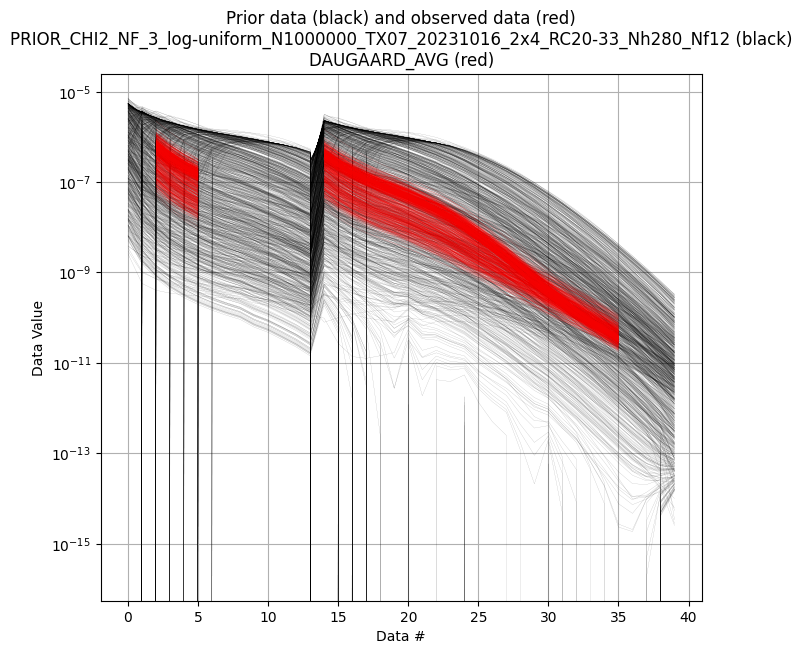

In [5]:
# into TWO data sets, LOW and HIGH moment.

ig.plot_data_prior(f_prior_data_h5, f_data_h5)

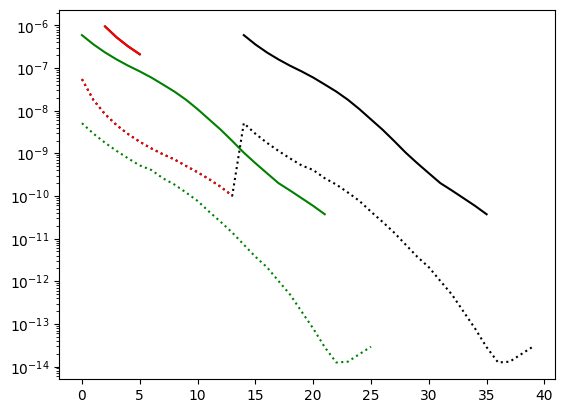

In [6]:
# Read D_obs from f_data_h5
with h5py.File(f_data_h5, 'r') as f:
    D_obs = f['D1/d_obs'][:]
    D_std = f['D1/d_std'][:]
    
with h5py.File(f_prior_data_h5, 'r') as f:
    D = f['/D1'][:]
    

nd = D_obs.shape[1]
n_low = 14
n_high = nd - n_low
# set i low to 0:n_low-1
i_low = range(n_low)
i_high = range(n_low, nd)

# Split prior data
D_low = D[:,i_low]
D_high = D[:,i_high]
# Split observed data
D_obs_low = D_obs[:,i_low]
D_std_low = D_std[:,i_low]*2
D_obs_high = D_obs[:,i_high]
D_std_high = D_std[:,i_high]*2


plt.semilogy(D_obs[0],'k-');
plt.semilogy(D_obs_low[0],'r-');
plt.semilogy(D_obs_high[0],'g-');

plt.semilogy(D[0],'k:');
plt.semilogy(D_low[0],'r:');
plt.semilogy(D_high[0],'g:');

In [7]:
f_data_dual_h5 = 'DAUGAARD_AVG_dual.h5'
ig.copy_hdf5_file(f_data_h5,f_data_dual_h5)
# Delete D1
with h5py.File(f_data_dual_h5, 'a') as f:
    # show groups in f['']
    if 'D1' in f.keys():
        del(f['D1'])
# Update D1 and D2      
with h5py.File(f_data_dual_h5, 'a') as f:
    # remove 'D1' 
    #del f['D1']
    f.create_dataset('D1/d_obs', data=D_obs_low)
    f.create_dataset('D1/d_std', data=D_std_low)
    f['D1'].attrs['noise_model'] = 'gaussian'
    f.create_dataset('D2/d_obs', data=D_obs_high)
    f.create_dataset('D2/d_std', data=D_std_high)
    f['D2'].attrs['noise_model'] = 'gaussian'

In [8]:
f_prior_data_dual_h5 = 'PRIOR_dual.h5'
ig.copy_hdf5_file(f_prior_data_h5,f_prior_data_dual_h5)

with h5py.File(f_prior_data_dual_h5, 'a') as f:
    # show groups in f['']
    if 'D1' in f.keys():
        del(f['D1'])
    f.create_dataset('D1', data=D_low)
    f.create_dataset('D2', data=D_high)

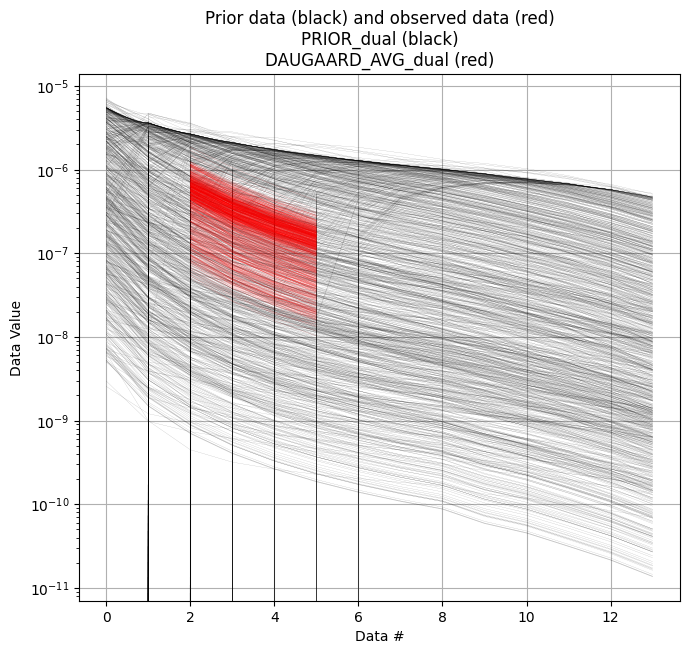

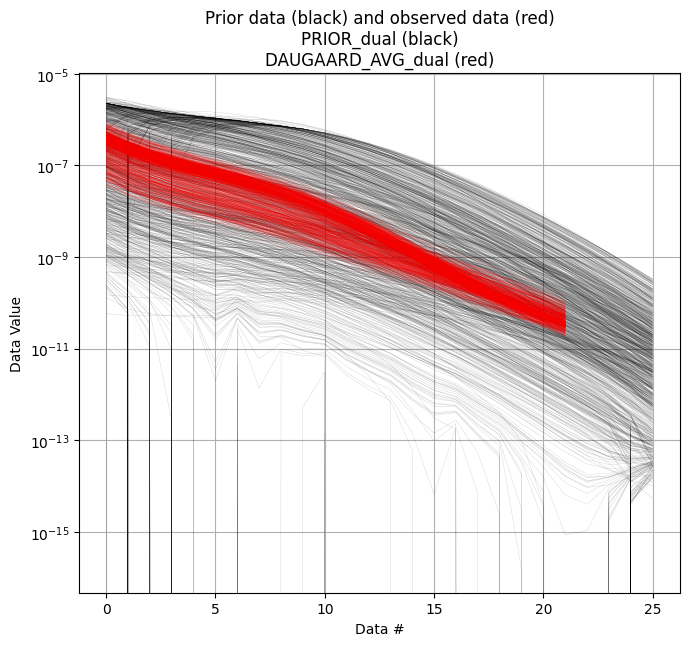

In [9]:
ig.plot_data_prior(f_prior_data_dual_h5, f_data_dual_h5, id=1)
ig.plot_data_prior(f_prior_data_dual_h5, f_data_dual_h5, id=2)

## Sample the posterior $\sigma(\mathbf{m})$

The posterior distribution is sampling using the extended rejection sampler.

In [10]:
N_use = 1000000 #%N
N_cpu = 6
f_post_arr = []
updatePostStat=False
for itype in [0,1,2,3]:
#for itype in [3]:
    if itype == 0:
        # LOW AND HIGH MOMENT AS ONE DATA SET
        f_post_h5 = ig.integrate_rejection(f_prior_data_h5, 
                                   f_data_h5, 
                                   f_post_h5='POST_type%d.h5' % itype,
                                   N_use = N_use, Ncpu=N_cpu,
                                   showInfo=1, 
                                   updatePostStat=updatePostStat)
    elif itype == 1:
        # LOW MOMENT ONLY
        f_post_h5 = ig.integrate_rejection(f_prior_data_dual_h5, 
                                   f_data_dual_h5, 
                                   f_post_h5='POST_type%d.h5' % itype,
                                   N_use = N_use, Ncpu=N_cpu,
                                   showInfo=1, 
                                   updatePostStat=updatePostStat,
                                   id_use = [1])
    elif itype == 2:
        # HIGH MOMENT ONLY
        f_post_h5 = ig.integrate_rejection(f_prior_data_dual_h5, 
                                   f_data_dual_h5, 
                                   f_post_h5='POST_type%d.h5' % itype,
                                   N_use = N_use, Ncpu=N_cpu,
                                   showInfo=1, 
                                   updatePostStat=updatePostStat,  
                                   id_use = [2])
    elif itype == 3:
        # JOINT INVERSION USING BOTH LOW AND HIGH MOMENT
        f_post_h5 = ig.integrate_rejection(f_prior_data_dual_h5, 
                                   f_data_dual_h5, 
                                   f_post_h5='POST_type%d.h5' % itype,
                                   N_use = N_use, Ncpu=N_cpu,
                                   showInfo=1, 
                                   updatePostStat=updatePostStat,  
                                   id_use = [1,2])

    f_post_arr.append(f_post_h5)



File POST_type0.h5 allready exists
Overwriting...
<--INTEGRATE_REJECTION-->
f_prior_h5=PRIOR_CHI2_NF_3_log-uniform_N1000000_TX07_20231016_2x4_RC20-33_Nh280_Nf12.h5
f_data_h5=DAUGAARD_AVG.h5
f_post_h5=POST_type0.h5


All done
T_av=15.7, Time=1072.1s/11693 soundings ,91.7ms/sounding, 10.9it/s
File POST_type1.h5 allready exists
Overwriting...
<--INTEGRATE_REJECTION-->
f_prior_h5=PRIOR_dual.h5
f_data_h5=DAUGAARD_AVG_dual.h5
f_post_h5=POST_type1.h5


All done
T_av=1.0, Time=483.8s/11693 soundings ,41.4ms/sounding, 24.2it/s
File POST_type2.h5 allready exists
Overwriting...
<--INTEGRATE_REJECTION-->
f_prior_h5=PRIOR_dual.h5
f_data_h5=DAUGAARD_AVG_dual.h5
f_post_h5=POST_type2.h5


All done
T_av=3.1, Time=736.0s/11693 soundings ,62.9ms/sounding, 15.9it/s
File POST_type3.h5 allready exists
Overwriting...
<--INTEGRATE_REJECTION-->
f_prior_h5=PRIOR_dual.h5
f_data_h5=DAUGAARD_AVG_dual.h5
f_post_h5=POST_type3.h5


All done
T_av=4.0, Time=1073.7s/11693 soundings ,91.8ms/sounding, 10.9it/s


In [11]:
for f_post_h5 in f_post_arr:
    ig.integrate_posterior_stats(f_post_h5)

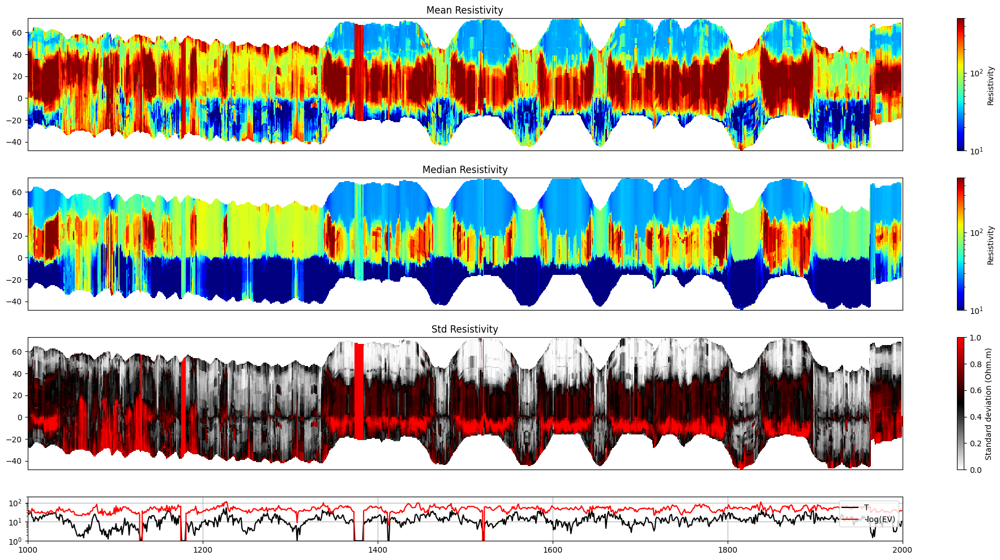

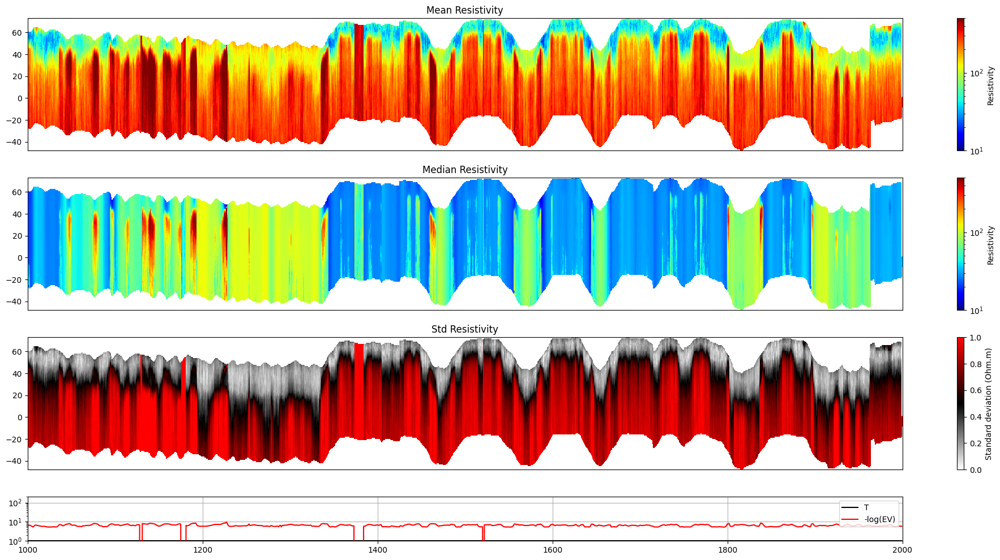

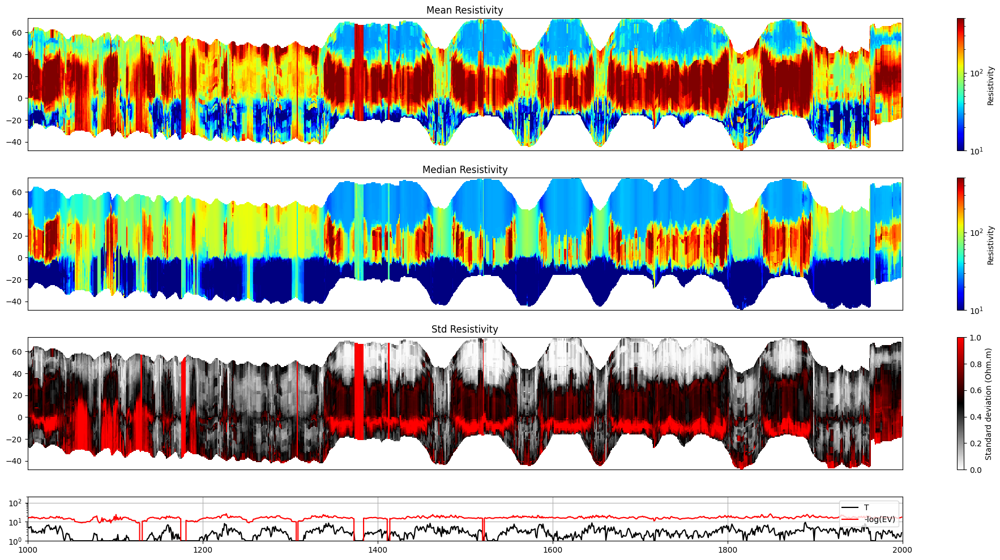

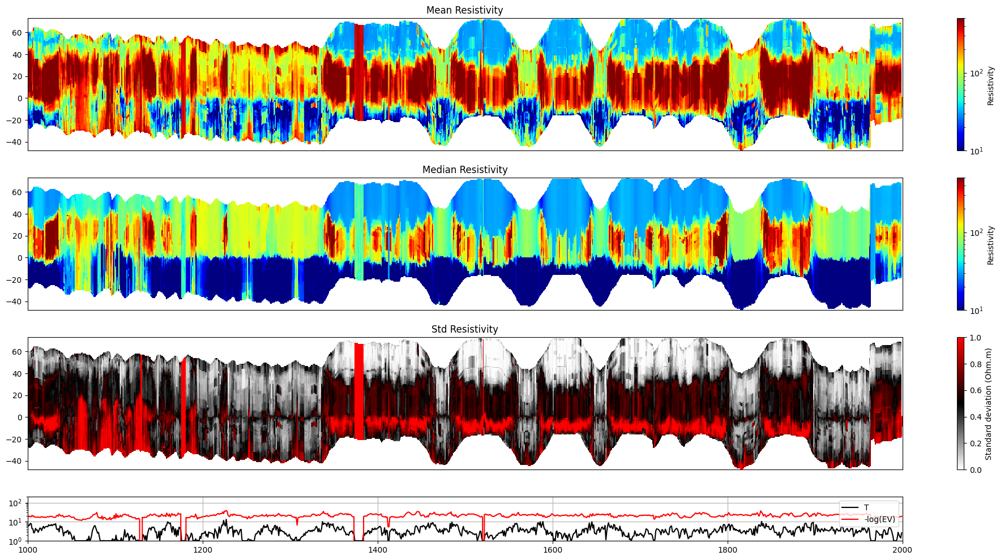

In [12]:
for f_post_h5 in f_post_arr:
    # % Plot Profiles
    ig.plot_profile(f_post_h5, i1=1000, i2=2000, im=1, hardcopy=hardcopy)

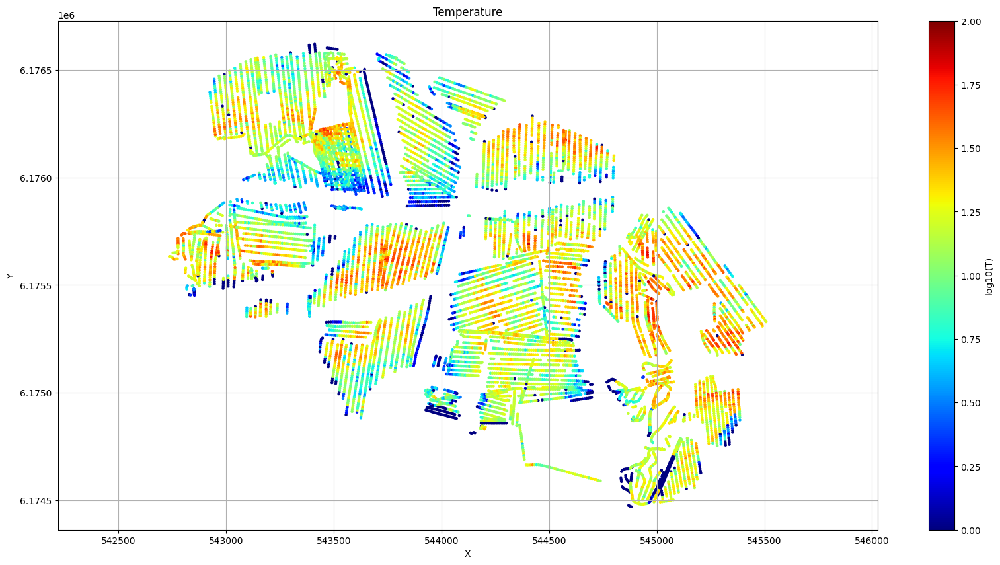

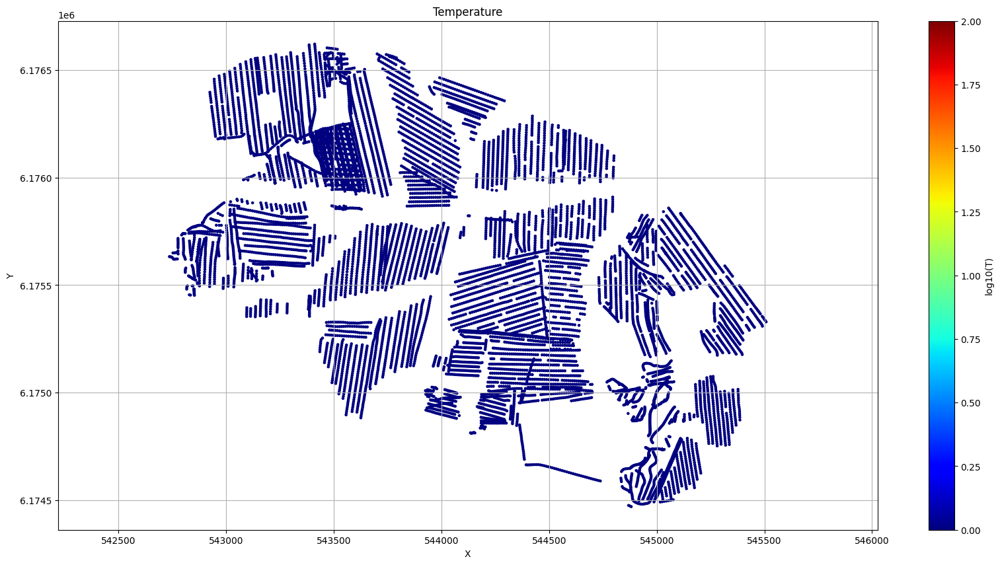

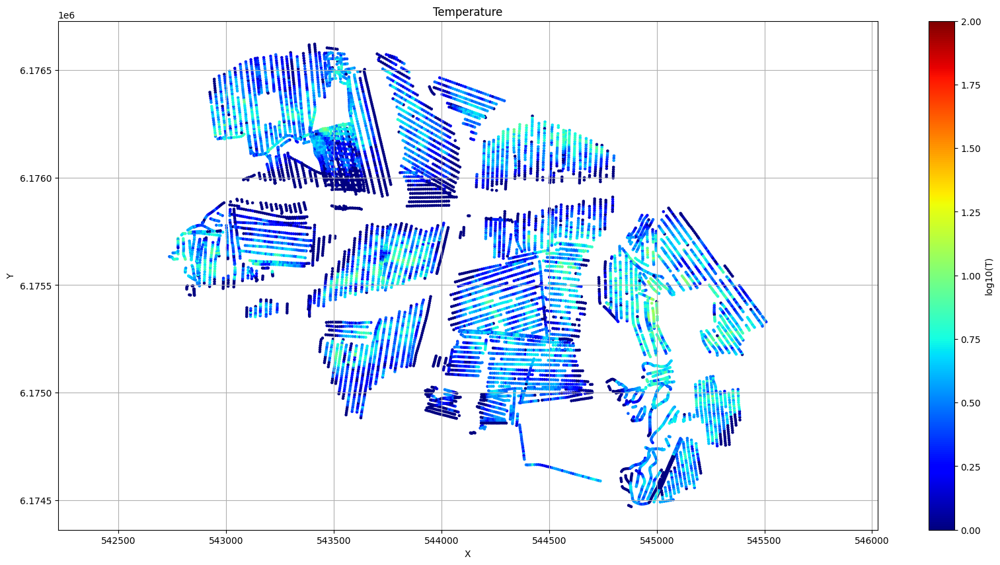

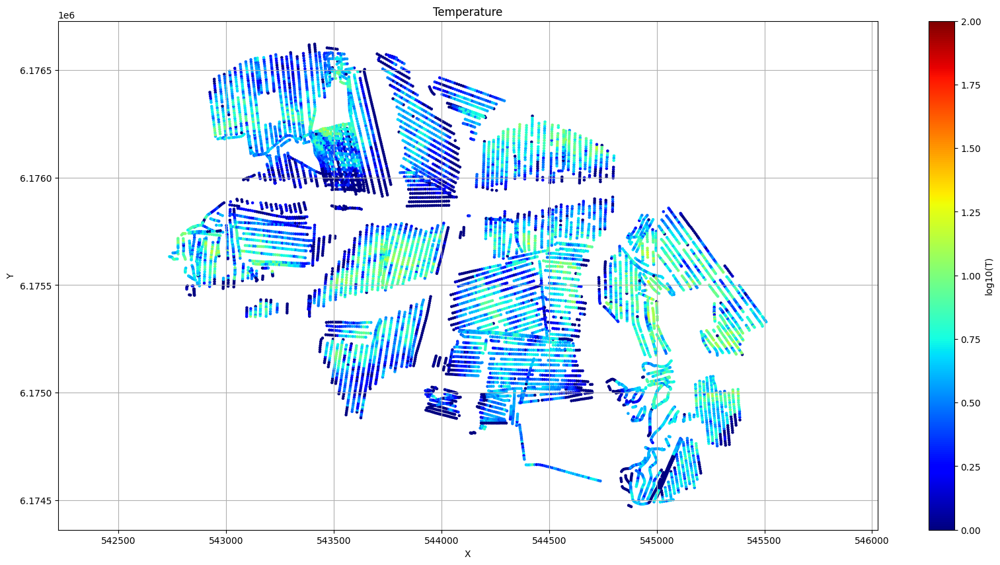

In [13]:
for f_post_h5 in f_post_arr:
    ig.plot_T_EV(f_post_h5, pl='T', hardcopy=hardcopy)
    plt.show()
    #ig.plot_T_EV(f_post_h5, pl='EV', hardcopy=hardcopy)

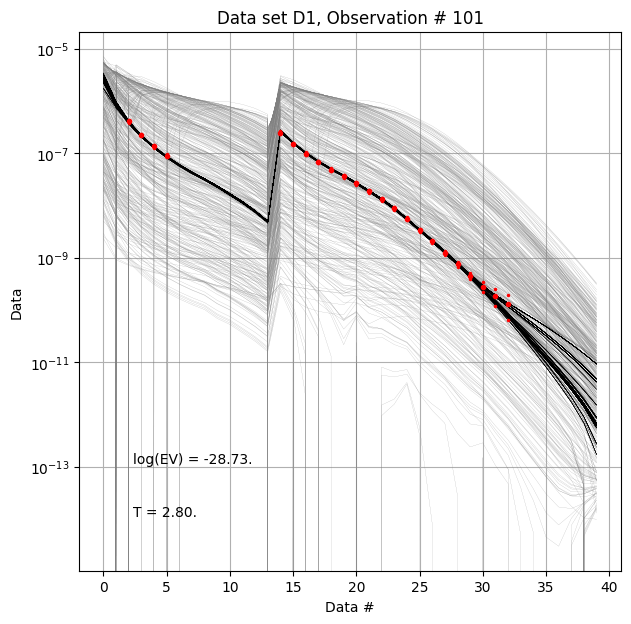

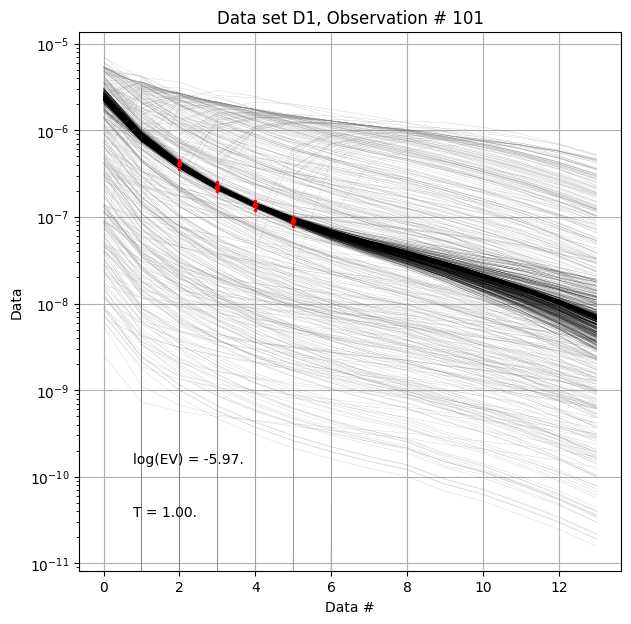

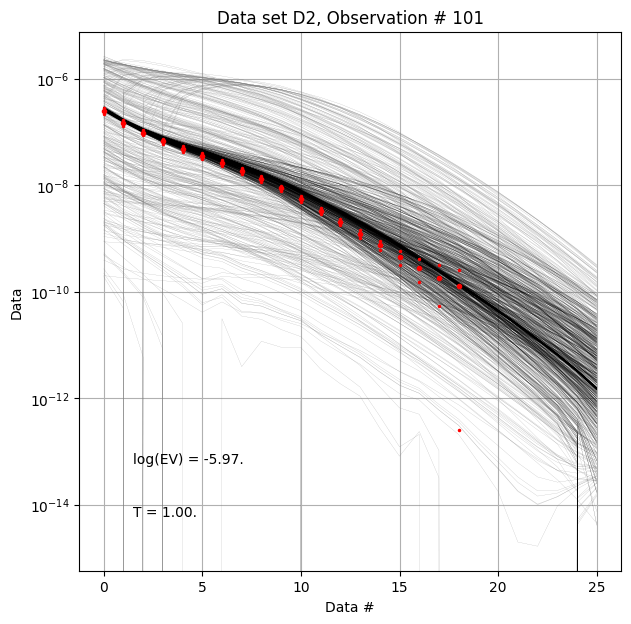

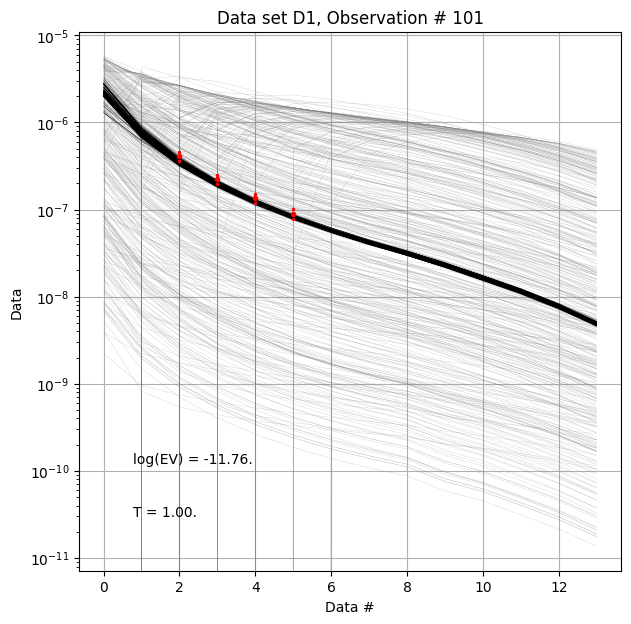

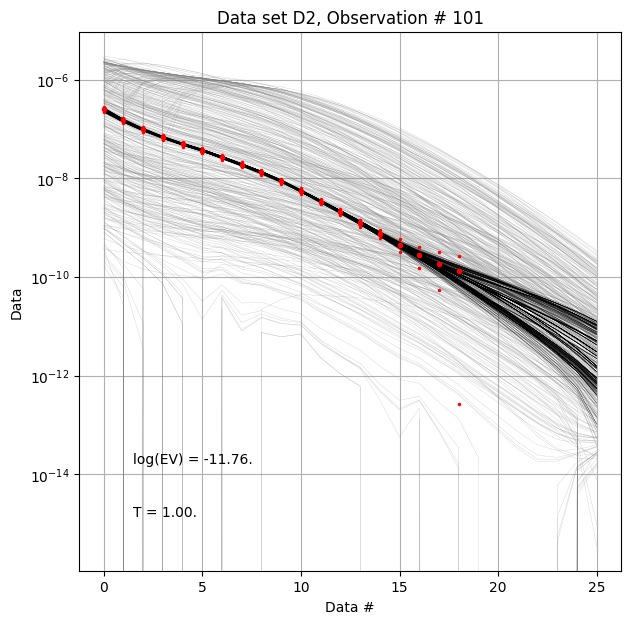

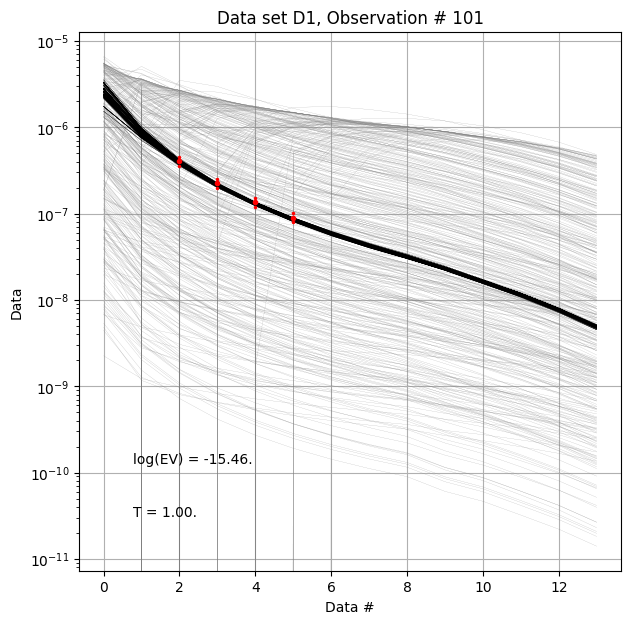

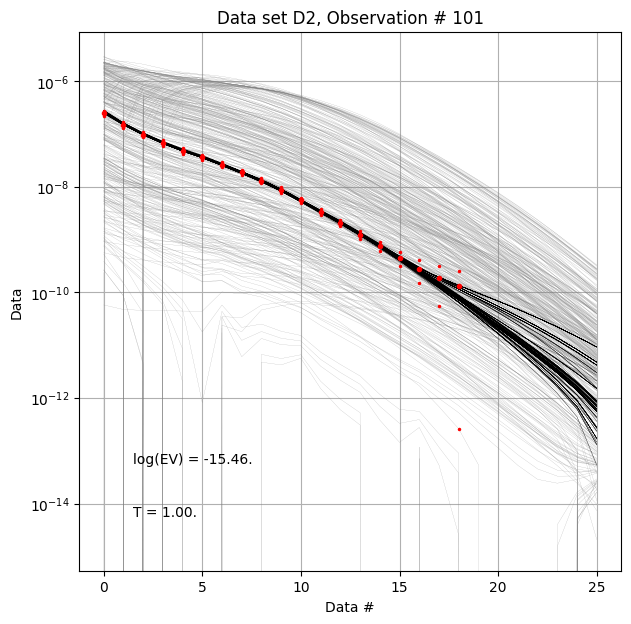

In [14]:
for f_post_h5 in f_post_arr:
    # % Plot prior, posterior, and observed  data
    ig.plot_data_prior_post(f_post_h5, i_plot=100, hardcopy=hardcopy)
    #ig.plot_data_prior_post(f_post_h5, i_plot=0, hardcopy=hardcopy)




Text(0, 0.5, 'N_UNIQUE')

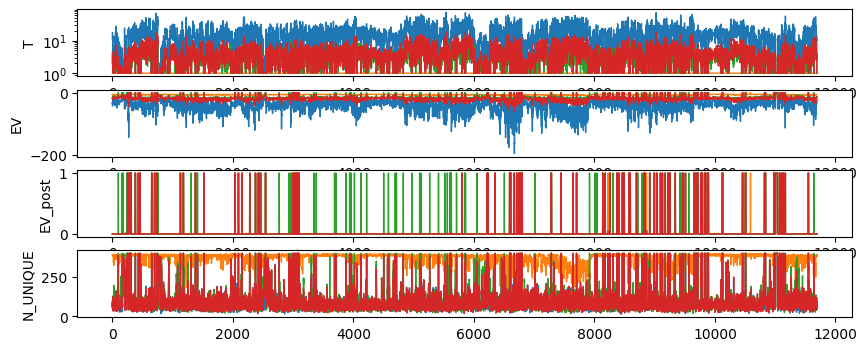

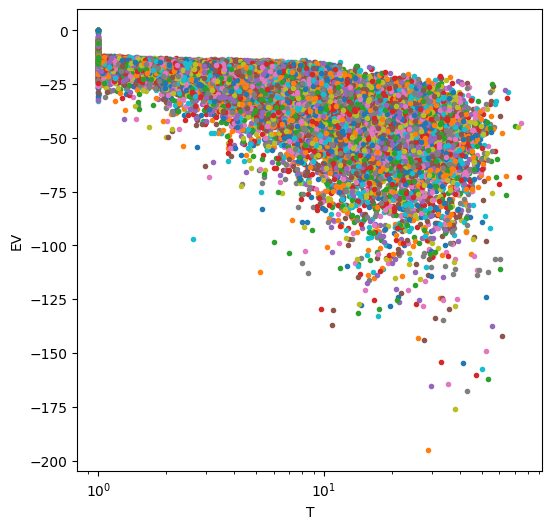

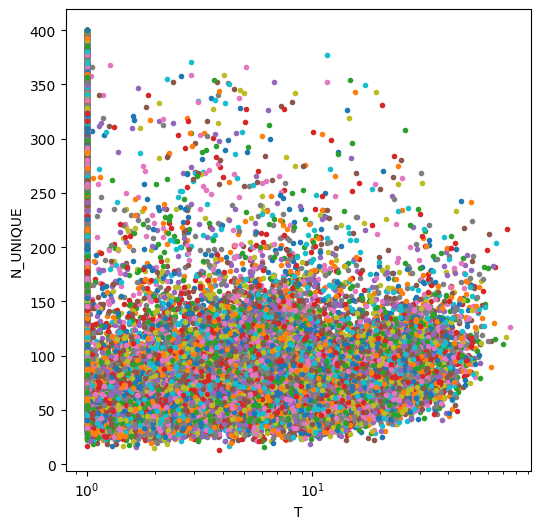

In [15]:
with h5py.File(f_data_h5, 'r') as f:    
    nobs = f['D1/d_obs'].shape[0]
    
ni=len(f_post_arr)

T = np.zeros((ni,nobs))
EV = np.zeros((ni,nobs))
EV_post = np.zeros((ni,nobs))
N_UNIQUE = np.zeros((ni,nobs))

i=-1
for f_post_h5 in f_post_arr:
    with h5py.File(f_post_h5, 'r') as f:
        i=i+1
        T[i] = f['/T'][:]
        EV[i] = f['/EV'][:]
        N_UNIQUE[i] = f['/N_UNIQUE'][:]
        EV_post[i] = f['/EV_post'][:]
    

fig, ax = plt.subplots(4,1,figsize=(10,4))
ax[0].semilogy(T.T,'-', linewidth=1)
ax[0].set_ylabel('T')
ax[1].plot(EV.T,'-', linewidth=1)
ax[1].set_ylabel('EV')
ax[2].plot(EV_post.T,'-', linewidth=1)
ax[2].set_ylabel('EV_post')
ax[3].plot(N_UNIQUE.T,'-', linewidth=1)
ax[3].set_ylabel('N_UNIQUE')

fig=plt.figure(figsize=(6,6))
plt.semilogx(T,EV,'.')
plt.xlabel('T')
plt.ylabel('EV')


fig=plt.figure(figsize=(6,6))
plt.semilogx(T,N_UNIQUE,'.')
plt.xlabel('T')
plt.ylabel('N_UNIQUE')



In [16]:
#ig.post_to_csv(f_post_h5)